# **Radio Towers Detection using Mask RCNN**

The aim of this project is to detect an Object in an Image using a [Mask RCNN](https://arxiv.org/pdf/1703.06870.pdf) with a [ResNet101](https://arxiv.org/pdf/1512.03385.pdf) backbone. The model segments the images creating masks for each object detected.
The implementation is a customized implementation of a [Pysource's public repository](https://github.com/pysource7/Mask_RCNN) using Python 3 and a COCO pre-built model.

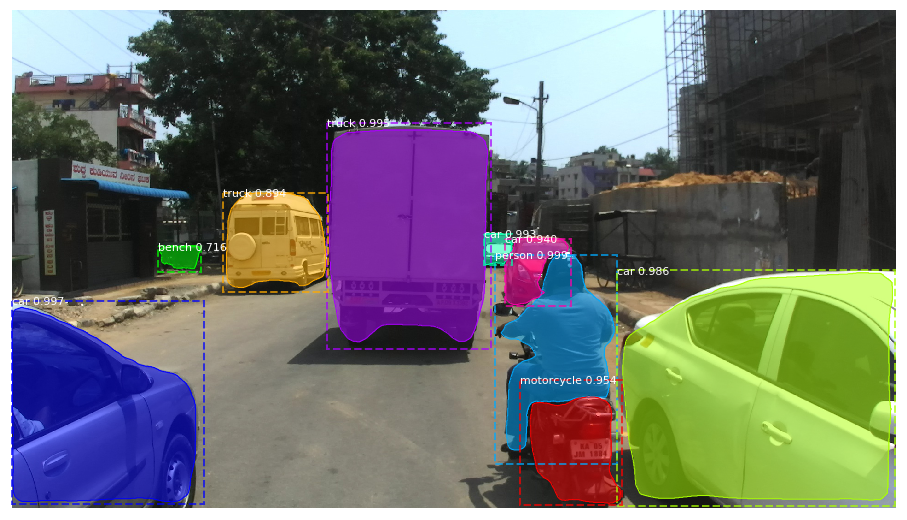

For this, some steps are needed:
1. Import the libraries and Load the model to be used.
2. Annotate and upload the dataset.
3. Train the model.
4. Test the accuracy of the model on a random image.

## **1. Installation**

In this part, the libraries will be imported and the model will be cloned from the repository:

In [2]:
# Set up the magic functions:
# Use Tensorflow version 1
%tensorflow_version 1.x 
# Display the plot under the cell that created it (1)
%matplotlib inline 

# Import the libraries and the code:
import sys
# import cv2 # Using Jupyter Notebook
from google.colab.patches import cv2_imshow # Using Google Colab
!pip install --upgrade h5py==2.10.0 # Manipulate the HDF5 binary data format easily (2)
!git clone https://github.com/pysource7/Mask_RCNN
sys.path.append("/content/Mask_RCNN/demo")
from train_mask_rcnn_demo import *
from mrcnn.visualize import random_colors, get_mask_contours, draw_mask


     |████████████████████████████████| 2.9 MB 4.3 MB/s 
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 1053, done.
remote: Total 1053 (delta 0), reused 0 (delta 0), pack-reused 1053
Receiving objects: 100% (1053/1053), 125.29 MiB | 21.91 MiB/s, done.
Resolving deltas: 100% (621/621), done.
VERS 0.2


Using TensorFlow backend.


... done downloading pretrained model!


(1) For more information, check the [documentation](https://ipython.readthedocs.io/en/stable/interactive/plotting.html)

(2) For more information, check the [documentation](https://www.h5py.org/)

Before training, it is essential to check if GPU is available, GPU will decrease the overall training time and can boost up the process:

In [3]:
# Check for GPU before training:
!nvidia-smi

Sun Nov 21 19:17:42 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8    26W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## **2. Image Dataset**

In this part, the dataset will be uploaded along with the annotations.

For this project, the objects to be detected are '[Radio Towers](https://en.wikipedia.org/wiki/Radio_masts_and_towers)'. The idea is to choose an object whose detection can serve an application or solve a problem.

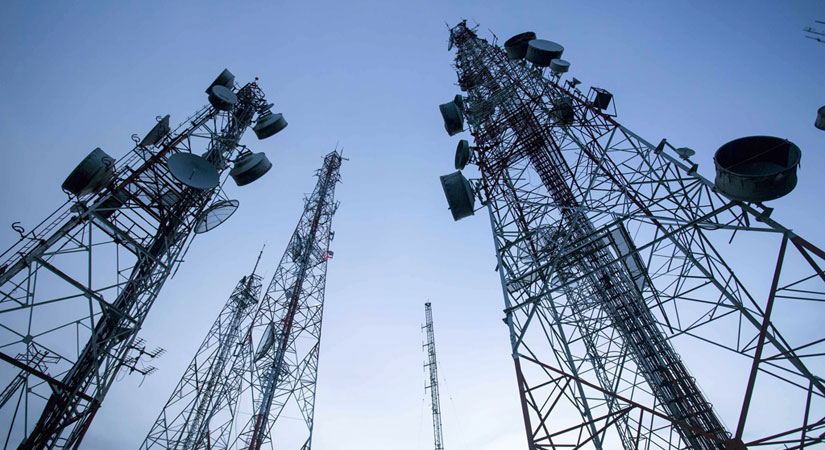

Radio towers' detection can be helpful in the telecommunications domain, detecting radio towers can be helpful to evaluate the architecture used by the service provider in terms of quality, redundancy and coverage by extracting the number of towers and the distance between them.

This is especially true in deep forests and inaccessible terrains using aerial images.

For this purpose, a dataset of 66 images (21-11-2021) were collected. The dataset is diverse containing pictures of multiple towers under different conditions: in the daylight, at night, at sunset and in foggy weather, from different angles: from above and below and using pictures of fallen towers to account for disaster recognition later.

Radio Towers serve different tasks and they are different in shape and equipments installed. However, in this project, they will be treated as a single class for the sake of simplicity.

In practice, having a bigger and diverse dataset will make the model more effective and achieve better results. Image Augmentation can be used to expand the dataset if only limited images are available. 

After the acquisition of the images, they need to be annotated ( labelled ). Each objected needs to be labelled to train the model.
The annotations were obtained after using the [Makesense platform ](https://www.makesense.ai/). Polygons were used to annotate the objects and the annotations are exported in a JSON file:


In [4]:
# Upload the annotations file:
annotations_path = "annotations.json"

In [5]:
# Upload the dataset:
images_path = "dataset.zip"

# Extract Images:
extract_images(os.path.join("/content/",images_path), "/content/dataset")

Extracted: 66 images


The dataset will be divided into Train and Validation sets. The train set will be used to train the model and the validation set will be used to evaluate the performance of the model:

In [6]:
# Divide the dataset into...
# Training set:
dataset_train = load_image_dataset(os.path.join("/content/", annotations_path), "/content/dataset", "train")
# Validation set:
dataset_val = load_image_dataset(os.path.join("/content/", annotations_path), "/content/dataset", "val")

# Determine the number of different objects ( or classes ) to be detected:
class_number = dataset_train.count_classes()

# Print the distribution:
print('Training images: %d' % len(dataset_train.image_ids))
print('Validation images: %d' % len(dataset_val.image_ids))
print("Classes detected: {}".format(class_number))

Annotation json path:  /content/annotations.json
Annotation json path:  /content/annotations.json
Training images: 59
Validation images: 7
Classes detected: 1


To visualize and validate the annotations, some pictures are displayed along with the corresponding annotations. The different classes of objects will be displayed in the same row:

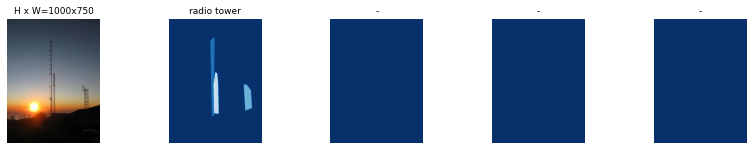

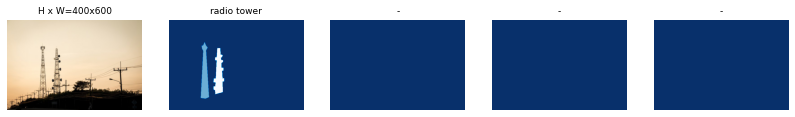

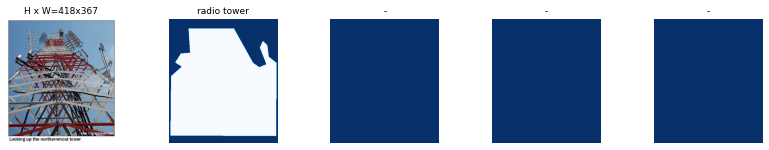

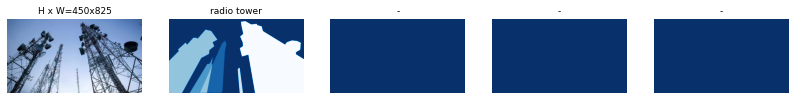

In [7]:
# Load images with the annotations:
display_image_samples(dataset_train)

##**3. Training**

Now that the dataset is prepared. The model will start training on the custom dataset. First, the Configuration of the model Mask RCNN with COCO weights is loaded:

In [8]:
# Load Configuration
config = CustomConfig(class_number)
model = load_training_model(config)



Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead
/content/Mask_RCNN/mask_rcnn_coco.h5


The configuration details can be visualized:

In [9]:
# Display the configuration:
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     4
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 4
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

After that, The training starts. However, depending on the setup used, it can take a long time.

The model will be trained for 5 epochs since the model is pre-trained and the data used is relatively simple:

In [ ]:
# Start Training: 
train_head(model, dataset_train, dataset_train, config) # With learning rate of 0.001


Starting at epoch 0. LR=0.001

Checkpoint Path: /content/Mask_RCNN/logs/object20211120T0348/mask_rcnn_object_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn

One thing to be aware of is Overfitting, this is when the model performs well within the images it used to train, but suffers when it comes to any image that wasn't part of his training. This can be noticeable when the overall loss continues to decrease while the validation loss increases with each epoch.

## **4. Detection**

After the training is complete, the model needs to be evaluated.
For the evaluation, two tests are proposed: A simple test on a random image from the dataset, and A test on a random image that the model never saw before:

### **A random image from the dataset** (Training required beforehand)

This is straight to the point, one image from the dataset is used to evaluate the performance of the model in term of segmentation and detection.
This is done after the training.

First, the latest weights are loaded:

In [ ]:
# Load Test Model:
test_model, inference_config = load_test_model(class_number)



Instructions for updating:
Use `tf.cast` instead.
Loading weights from  /content/Mask_RCNN/logs/object20211120T0348/mask_rcnn_object_0005.h5
Re-starting from epoch 5


This is the model obtained after the last epoch

Now, one random image is put to the test to see how many objects were detected:

original_image           shape: (512, 512, 3)         min:    0.00000  max:  205.00000  uint8
Trained model result
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  205.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   81.30000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32
Annotation


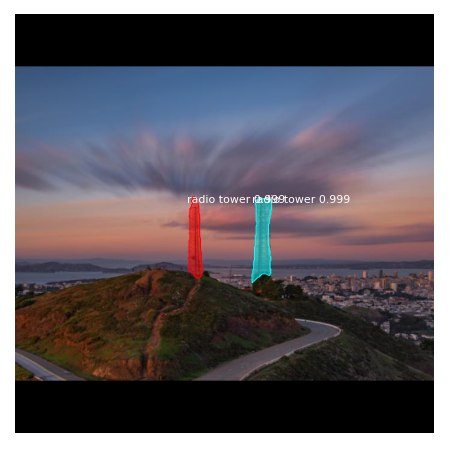

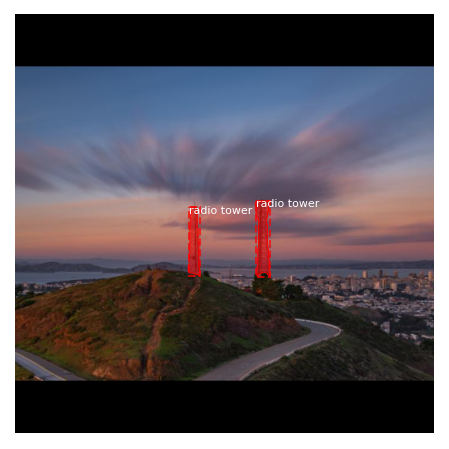

In [ ]:
# Test on a random image from dataset:
test_random_image(test_model, dataset_val, inference_config)

The objects were detected but this test alone doesn't fully evaluate the accuracy of the model. For this, another test is required.

### **A random image from outside the dataset** (No Training required beforehand)

To better evaluate the model, two images are used to evaluate the performance of the model in term of segmentation and detection.
For this, the weights are loaded from a trained model and thus no training is needed. 

The first image contains multiple real-world towers to evaluate if the system can detects multiple objects.

The second image contains a tower from a video game Far Cry 6 to evaluate if the system can detect objects even in the context of simulations and video games graphics.

First, the images are loaded:


In [32]:
# Load Images:
img1 = cv2.imread("/content/image10.jpg")
img2 = cv2.imread("/content/image2.JPG")

# Print the resolutions:
print(img1.shape)
print(img2.shape)

(2208, 3456, 3)
(602, 989, 3)


Now, the model is loaded:

In [12]:
# Load the model:
model_path = "/content/mask_rcnn_object_0005.h5"
test_model, inference_config = load_inference_model(1, model_path)



Instructions for updating:
Use `tf.cast` instead.
Loading weights from  /content/mask_rcnn_object_0005.h5


After that, The results of the detection are obtained from the processed images:

In [33]:
# Preprocess the images:
image1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Detect results:
r1 = test_model.detect([image1])[0]
r2 = test_model.detect([image2])[0]

Finally, the resulting masks are drawn on the images and visualized.

For the first image:

4


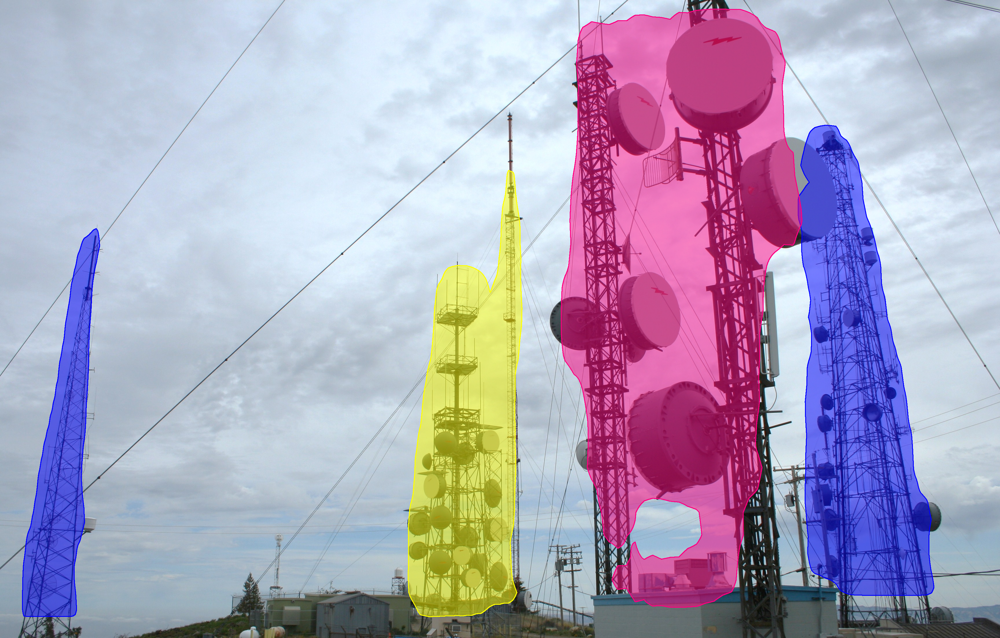

In [30]:
# Count the number of objects detected:
object_count = len(r1["class_ids"])
print(object_count)

# Select colors for display:
colors = random_colors(object_count)

# Get Coordinates of the object:
for i in range(object_count):
    mask = r1["masks"][:, :, i]
    contours = get_mask_contours(mask)
    # Draw the masks on the image:
    for cnt in contours:
        cv2.polylines(img1, [cnt], True, colors[i], 2)
        img1 = draw_mask(img1, [cnt], colors[i])

# Display the results:
cv2_imshow(img1) # Using Google Colab
#cv2.imshow(img1) # Using Jupyter Notebook

According to the results, the model is well-trained to detect radio towers in real environments. Even though the model was trained using low resolution images, it can detect the objects in a high resolution image. However, the detection is not perfect. Since the model is not trained enough with a big dataset, it can misunterpret when two objects are intersecting as shown.

For the second image:

1


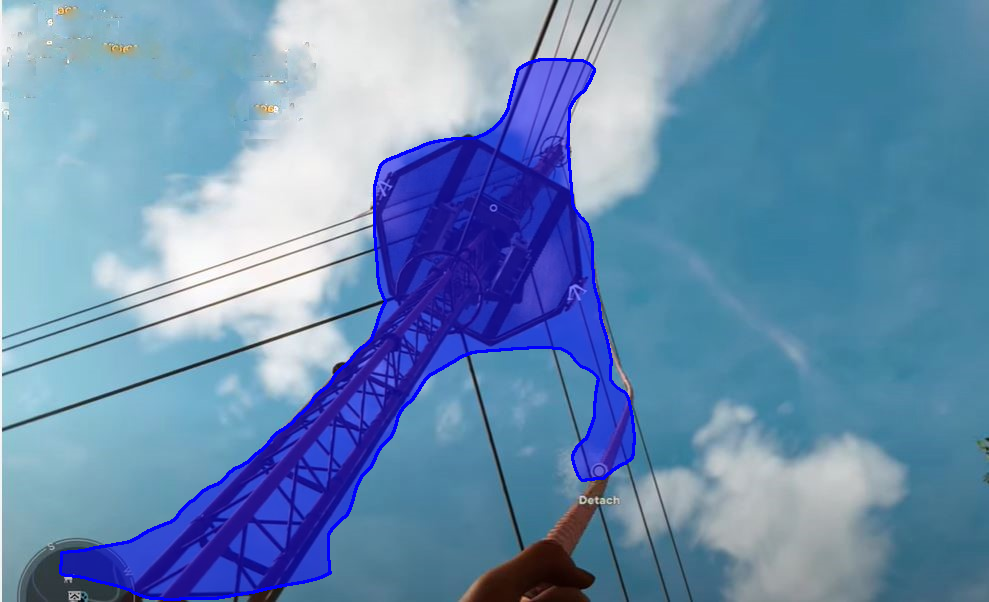

In [34]:
# Count the number of objects detected:
object_count2 = len(r2["class_ids"])
print(object_count2)

# Select colors for display:
colors2 = random_colors(object_count2)

# Get Coordinates of the object:
for i in range(object_count2):
    mask = r2["masks"][:, :, i]
    contours = get_mask_contours(mask)
    # Draw the masks on the image:
    for cnt in contours:
        cv2.polylines(img2, [cnt], True, colors2[i], 2)
        img2 = draw_mask(img2, [cnt], colors2[i])

# Display the results:
cv2_imshow(img2) # Using Google Colab
#cv2.imshow(img2) # Using Jupyter Notebook

Again, the model was able to detect the object in a video game nvironment. However, the segmentation is not perfect since the model is not trained to provide higher accuracy.

### **Limitations**

So far, the model is trained to detect radio towers in normal situations. For disaster situations or extreme scenarios like the scenario illustrated in the image below, the model will suffer.

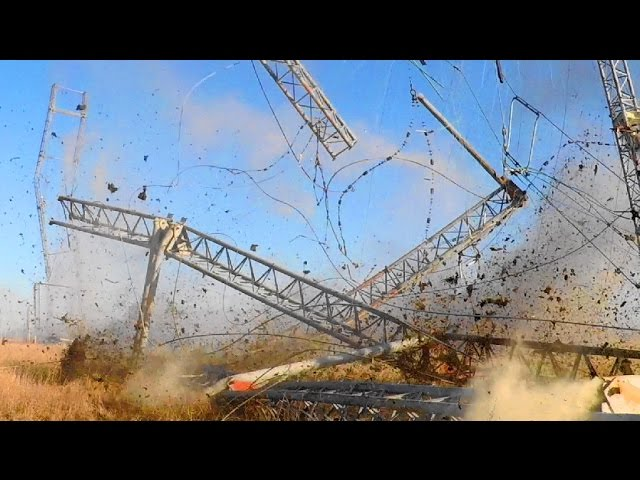

However, this is the only the beginning. With enough images and enough training, the model will be able to achieve better results.

For future work, more images need to be acquired and the dataset will be more diverse using Data Augmentation. Providing enough training is mandatory to achieve better results.
